<a href="https://colab.research.google.com/github/dalisson/IntroducaoRedesNeurais/blob/master/Introducao_a_redes_neurais_part2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Classificação Binária

In [0]:
%matplotlib inline

In [0]:
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
import numpy as np

##### Vamos preparar os dados

Vamos conseguir os dados.

In [3]:
# n amostras de duas features
n = 400
X_input = (torch.rand((n, 2)) > 0.5).type(torch.FloatTensor)
Y_input = (X_input[:,0] != X_input[:,1]).type(torch.LongTensor)
X_input += (torch.rand(n,2).normal_() * 0.04)
X_input[:8], Y_input[:8]

(tensor([[-0.0280,  0.0081],
         [ 0.9671,  0.0142],
         [ 0.0340,  1.0084],
         [ 1.0514,  1.0244],
         [-0.1010,  0.9882],
         [ 0.9675,  0.0675],
         [ 0.9717,  0.0301],
         [ 1.0391,  1.0013]]), tensor([0, 1, 1, 0, 1, 1, 1, 0]))

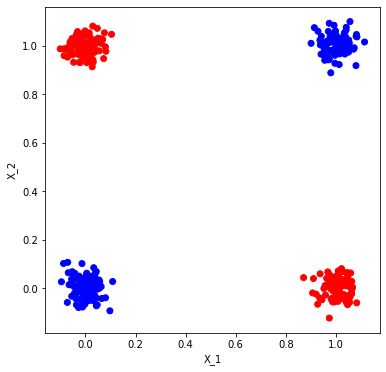

In [4]:
#Esse codigo nao importa, e so python normal
plt.figure(figsize=(6,6))
plt.scatter(X_input[:,0], X_input[:,1], c=[(lambda x : 'red' if x > 0 else 'blue') (x) for x in Y_input])
plt.xlabel('X_1')
plt.ylabel('X_2')
plt.show()

Como podemos ver temos duas grandes classes nesse problema, trata-se também de um problema não linear (é impossível separar a classe vermelha da azul através de uma única linha), o que é perfeito para usarmos uma rede de três camadas. 

Ficar trabalhando com X e Y separados é problemático, vamos organizar um dataset.

- Em pytorch os datasets herdam da classe Dataset e precisam necessariamente sobrescrever dois metodos \_\_getitem__ e \_\_len__



In [0]:
from torch.utils.data import Dataset

class XORDataset(Dataset):
  
  def __init__(self, X,Y):
    super(XORDataset, self).__init__()
    #o componente tem que falhar se tivermos numero diferente de dados e labels
    assert len(X) == len(Y)
    self.X = X
    self.Y = Y
    
  def __len__(self):
    return len(self.X)
  
  def __getitem__(self, i):
    return self.X[i], self.Y[i]

In [6]:
#instanciando nossos datasets
n_dados_treino = (n//100) * 90 
dataset_treino = XORDataset(X_input[:n_dados_treino], Y_input[:n_dados_treino])
dataset_teste = XORDataset(X_input[n_dados_treino:], Y_input[n_dados_treino:])
#so pra tester se ta funcionando
len(dataset_treino), len(dataset_teste)

(360, 40)

Agora que temos datasets, vamos criar dataloaders, basicamente um dataloader carrega os dados contidos no dataset, vamos criar dois, um pra treino e um pra teste.

In [0]:
from torch.utils.data import DataLoader

In [0]:
dataloader_treino = DataLoader(dataset=dataset_treino, batch_size=64, shuffle=True)
dataloader_teste = DataLoader(dataset=dataset_teste, batch_size=64, shuffle=False)
#de novo testar se funcinou
#next(iter(dataloader_treino))[:3], next(iter(dataloader_teste))

##### Rede Neural

Vamos usar as camadas do torch, a camada densa se chama linear, vamos usar outra função de ativação dessa vez a ReLU definida como max(0, entrada) e por último a camada de softmax.

A softmax é necessária em tarefas de classificação.

- Ela transforma a entrada em uma função de distribuição de probabilidade, traduzindo, o vetor que entram nela passaa a ter valor de 0 a 1, que representa a probabilidade de ser cada classe probalidade e se voce somá-los o resultado da 1.

Na verdade utilizamos sempre o logaritmo da softmax, felizmente o pytorch também tem isso implementado para nós, chama-se LogSoftmax.



Softmax

<p><img alt="gradiente descendente" height="400px"width="600px"src="https://miro.medium.com/max/2482/1*hwdjtUG2pv8EhuxcR4mWmA.png" align="right" hspace="10px" vspace="10px">

<p> - Note que temos 3 classes, as probabilidades somam para um e cada probabilidade individual é maior que zero (isso é o significado de função de distribuição de probabilidade).</p>
<p> - Para transformar a softmax em log softmax é só tirar o logaritmo natural de cada um desses resultados da softmax, e.g., log(0.7) = -0.356.</p>

In [0]:
#primeiro vamos listar as camada que vamos usar
#basicamente a entrada de duas features vai para ser projetada em uma camada escondida de 3 neuronios e pela funcao de ativação ReLU
#depois vai para a camada de saida para classificação entre duas classes 1 ou 0
camadas = [nn.Linear(2, 3, bias=True), nn.ReLU(), nn.Linear(3,2, bias=True), nn.LogSoftmax(dim=1)]

<p><img alt="Rede de classificacao" height="400px"width="600px"src="https://drive.google.com/uc?id=1RjY40I-4aHDXAU-44DhU_n57Ir3ZlRiz"align="right" hspace="10px" vspace="10px">
<p> Nossa nova rede </p>

In [10]:
#vamos olhar dentro da camada linear
exemplo_linear = nn.Linear(2, 3, bias=True)
exemplo_linear.weight, exemplo_linear.bias

(Parameter containing:
 tensor([[-0.1900,  0.3619],
         [ 0.3433, -0.5941],
         [-0.5190,  0.3694]], requires_grad=True), Parameter containing:
 tensor([ 0.2190, -0.4609,  0.2919], requires_grad=True))

In [11]:
#vamos encapsular as camadas em uma classe
# a hora ideal para aprender mais sobre python e seus dunders
import torch.nn as nn
class RedeNeural(nn.Module):

  def __init__(self, camadas):
    self.camadas = camadas

  def __call__(self, x):
    '''
    dunder call, permite chamar a classe como funcao
    '''
    for camada in self.camadas:
      x = camada(x)
    return x
  
  def __repr__(self):
    '''
    dunder repr da a representacao da classe quando fazemos print
    '''
    nomes = 'entrada->'
    for camada in self.camadas:
      nomes += camada.__repr__() + '->'
    return nomes + 'saida'
  
  def parameters(self):
    '''
    retornar os parametros que serao treinados
    '''
    parametros = []
    for camada in self.camadas:
      if hasattr(camada, 'parameters'):
        parametros.append(camada.parameters())
    
    return parametros


rede = RedeNeural(camadas=camadas)

print(rede)

entrada->Linear(in_features=2, out_features=3, bias=True)->ReLU()->Linear(in_features=3, out_features=2, bias=True)->LogSoftmax()->saida


In [12]:
#só pra teste
batch_teste, _ = next(iter(dataloader_treino))
#podemos usar a rede como uma funcao porque implementamos o dunder __call__
rede(batch_teste)

tensor([[-0.5289, -0.8897],
        [-0.5082, -0.9203],
        [-0.5363, -0.8793],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5295, -0.8889],
        [-0.5082, -0.9203],
        [-0.5350, -0.8811],
        [-0.5082, -0.9203],
        [-0.5332, -0.8837],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5427, -0.8702],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5396, -0.8746],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5340, -0.8825],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5082, -0.9203],
        [-0.5424, -0

Métodos com a assinatura \_\_metodo__ são chamados de dunders, ou double unders, eles são muito importantes e definem comportamentos em python, deixamos para o estudante uma lista com exemplos de outros dunders de interesse, obviamente,  não é uma lista exaustiva:
- \_\_enter\__
- \_\_exit__
- \_\_iter__
- \_\_len__
- \_\_del__

<h4>Tivemos que implementar um monte de coisas na classe RedeNeural, seria bom se o pytorch tivesse essas coisas implementadas para nós e por sorte ele tem.</h4>

Pytorch possui uma classe chamada Module, disponível torch.nn, essa classe contém um monte de coisas úteis implementadas e é sempre a base das redes neurais.
Vamos reescrever a classe RedeNeural, dessa vez com herança.

In [0]:
class RedeNeural(nn.Module):

  def __init__(self, camadas):
    super(RedeNeural, self).__init__()
    for i, camada in enumerate(camadas):
      #essa função registra a camada dentro da classe
      #o primeiro parametro é onde o modulo vai ser registrada, o segundo o nome do modulo e terceiro o modulo em si 
      nn.Module.add_module(self, 'camada_%s' %i, camada) 

  def forward(self, x):
    '''
    Pela documentação precisamos sobreescrever esse metodo, na verdade __call__ da classe mae chama esse metodo
    '''
    for camada in self.children():
      x = camada(x)
    return x

rede = RedeNeural(camadas=camadas)

!!! Nota importante !!!
Até mesmo as camadas básicas do pytorch herdam de nn.Module

In [14]:
nn.Linear.__bases__

(torch.nn.modules.module.Module,)

In [15]:
rede

RedeNeural(
  (camada_0): Linear(in_features=2, out_features=3, bias=True)
  (camada_1): ReLU()
  (camada_2): Linear(in_features=3, out_features=2, bias=True)
  (camada_3): LogSoftmax()
)

Ainda mais simples, podemos colocar as camadas dentro da classe sem precisar de passar por lista, nesse caso, são automaticamente registradas dentro da classe como módulos.

In [16]:
class RedeNeural(nn.Module):

  def __init__(self, input_size, hidden_size, output_size):
    super(RedeNeural, self).__init__()
    self.camada_escondida = nn.Linear(input_size, hidden_size, bias=True)
    self.func_ativacao = nn.ReLU(inplace=True)
    self.camada_saida = nn.Linear(hidden_size, output_size, bias = True)
    self.log_softmax = nn.LogSoftmax(dim=-1)

  def forward(self, x):
    '''
    Pela documentação precisamos sobreescrever esse metodo, na verdade __call__ da classe mae chama esse metodo
    '''
    for camada in self.children():
      x = camada(x)
    
    return x

rede = RedeNeural(2,3,2)
rede

RedeNeural(
  (camada_escondida): Linear(in_features=2, out_features=3, bias=True)
  (func_ativacao): ReLU(inplace=True)
  (camada_saida): Linear(in_features=3, out_features=2, bias=True)
  (log_softmax): LogSoftmax()
)

<h4>Isso ainda é coisa demais para nós, nosso modelo é muito simples só 4 camadas em sequencia, o pytorch tem uma coisa menor com as mesmas funcionalidades anteriores para modelos em sequencia.</h4>

In [17]:
rede = nn.Sequential(*camadas)
rede

Sequential(
  (0): Linear(in_features=2, out_features=3, bias=True)
  (1): ReLU()
  (2): Linear(in_features=3, out_features=2, bias=True)
  (3): LogSoftmax()
)

Agora que temos a rede vamos pegar o optimizador do pytorch

##### Optimizador

De novo o gradiente descendente, dessa vez o do próprio Pytorch. Vamos passar os parametros da rede para ele.

In [0]:
from torch.optim import SGD
optimizador = SGD(params=rede.parameters(), lr=2e-2, momentum=0.9)

###### Função de perda

Nossa função de perda padrão para classificação é NLLoss, não discutiremos em detalhes a matemática por trás, mas basicamente ela usa o negativo da saída da camada log_softmax do modelo para computar a perda.
- Fato interessante, a junção de log_softmax com nllloss se chama cross_entropy poderiamos ter pego ela direto se nao tivessemos incluido a camada de logsoftmax no nosso modelo.

<p><img alt="NLLLoss" height="400px"width="600px"src="https://i.imgur.com/hU252jE.jpg" align="right" hspace="10px" vspace="10px">

In [0]:
from torch.nn import NLLLoss
criterion = NLLLoss()

##### Métrica

Dessa vez nossa metrica vai ser a acurácia, pytorch nao tem por default, vamos ter que definir a função nós mesmos. Basicamente queremos a procentagem de vezes em que a previsão é igual à classe real.



In [0]:
def acuracia(y_hat, y):
  prediction = torch.max(y_hat, dim=-1)[-1]
  return (prediction == y).type(torch.FloatTensor).mean().detach().numpy()

###### Agora vamos treinar o modelo

In [0]:
#reinstanciando todas as coisas
camadas = [nn.Linear(2, 3, bias=True), nn.ReLU(), nn.Linear(3,2, bias=True), nn.LogSoftmax(dim=1)]
rede = nn.Sequential(*camadas)
optimizador = SGD(params=rede.parameters(), lr=2e-2, momentum=0.9)

In [0]:
def update_func( x, y, is_eval=False):
  y_hat = rede(x)
  # se estivermos em avaliacao nao vamos calcular erro ou atualizar parametros
  if is_eval:
    return acuracia(y_hat, y)
  #calcula o erro
  loss = criterion(y_hat, y)
  #propaga o gradiente pela rede
  loss.backward()
  #atualiza os parametros
  optimizador.step()
  #zera os gradientes
  optimizador.zero_grad()
  return loss

In [31]:
n_epochs = 2500
for epoch in range(n_epochs):
  optimizador.zero_grad()
  losses = 0
  accs = 0
  iteracoes = 0
  #coloca a rede em modo de treino
  rede.train()
  for x, y in dataloader_treino:
    loss = update_func(x, y, is_eval=False)
    iteracoes += 1
    losses += loss.detach().numpy()
  losses = losses/iteracoes 
  #coloca a rede em modo de teste
  rede.eval()
  iteracoes = 0
  for x, y in dataloader_teste:
    acc = update_func(x, y, is_eval=True)
    iteracoes += 1
    accs += acc
  accs = accs/iteracoes 
  if epoch % 200 == 0:
    print('loss', losses, 'acc', accs)

loss 0.6975788176059723 acc 0.4000000059604645
loss 0.0026990506254757443 acc 1.0
loss 0.001092516244777168 acc 1.0
loss 0.0006648617854807526 acc 1.0
loss 0.0004838195357782145 acc 1.0
loss 0.0003606881412755077 acc 1.0
loss 0.0002923667343566194 acc 1.0
loss 0.00024692434575020644 acc 1.0
loss 0.00021601545934875807 acc 1.0
loss 0.00019162261257103333 acc 1.0
loss 0.00016083715308923274 acc 1.0
loss 0.0001452428514312487 acc 1.0
loss 0.0001327541091692789 acc 1.0


###### Vamos visualizar o espaço de separacao

In [0]:
x_grid = torch.arange(-0.2,1.2, 0.02)
grid = torch.tensor([[x, y] for x in x_grid for y in x_grid])
space_label = torch.max(rede(grid), dim=-1)[-1]

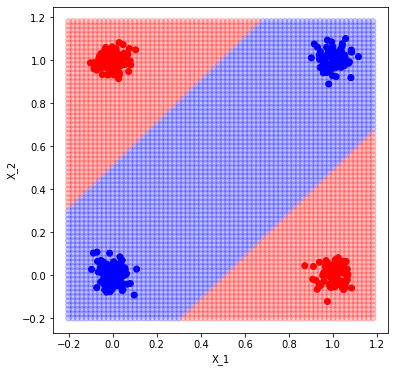

In [33]:
plt.figure(figsize=(6,6))
plt.scatter(grid[:,0], grid[:,1], c= [(lambda x: 'blue' if x == 0 else 'red')(x) for x in space_label], alpha=0.2, marker = 'o')
plt.scatter(X_input[:,0], X_input[:,1], c=[(lambda x : 'red' if x > 0 else 'blue') (x) for x in Y_input])
plt.xlabel('X_1')
plt.ylabel('X_2')
plt.show()

##### Visualizar o processo de treinamento

In [0]:
def update_func( x, y, is_eval=False):
  y_hat = rede(x)
  loss = criterion(y_hat, y)
  loss.backward()
  optimizador.step()
  optimizador.zero_grad()

In [0]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

In [28]:
camadas = [nn.Linear(2, 3, bias=True), nn.ReLU(), nn.Linear(3,2, bias=True), nn.LogSoftmax(dim=1)]
rede = nn.Sequential(*camadas)
optimizador = SGD(params=rede.parameters(), lr=2e-2, momentum=0.9)


space_label = torch.max(rede(grid), dim=-1)[-1]
c = [(lambda x: 'blue' if x == 0 else 'red')(x) for x in space_label]


fig = plt.figure()
plt.scatter(X_input[:,0], X_input[:,1], c=[(lambda x : 'red' if x > 0 else 'blue') (x) for x in Y_input])
scatter = plt.scatter(grid[:,0], grid[:,1], alpha=0.2, c=c, marker = 'o')
plt.close()

def animate(i):
    for x, y in dataloader_treino:
      update_func(x, y, is_eval=False)
    space_label = torch.max(rede(grid), dim=-1)[-1]
    c = [(lambda x: 'blue' if x == 0 else 'red')(x) for x in space_label]
    scatter.set_color(c)
    return scatter,

animation.FuncAnimation(fig, animate, np.arange(0, 100), interval=20)